In [1]:
from re import U
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
from icecream import ic # for printing/debugging
import pandas as pd

import patchify as pat
from pathlib import Path

# import custom modules
import NavigatingTheMatrix as nvm
import As_detection as asd

# importlib allows to reload the module if changes have been made to it without having to restart the whole kernel
import importlib

import torch
from torchvision import transforms


c:\Users\nkolev\OneDrive - University College London\Documents\GitHub\NavigatingTheMatrix\As_detection.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

In [2]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'examples' / '20181123-122007_STM_AtomManipulation-Earls Court-Si(100)-H term--26_1.Z_mtrx'

scan_dict = {'file': str(path), 
                'standard_pix_ratio': 1024/200
                }

scan = nvm.STM( scan_dict )
    

Pixel to nm ratio is twice as large as desired in trace up fwd . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired in retrace up . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired in trace down . Pixels will be halved so that feature detection can be carried out on surface.
Pixel to nm ratio is twice as large as desired in retrace down . Pixels will be halved so that feature detection can be carried out on surface.


In [3]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

scan.clean_up(scan.trace_down, 'trace down', plane_level=True)
scan.clean_up(scan.retrace_down, 'retrace down', plane_level=True)

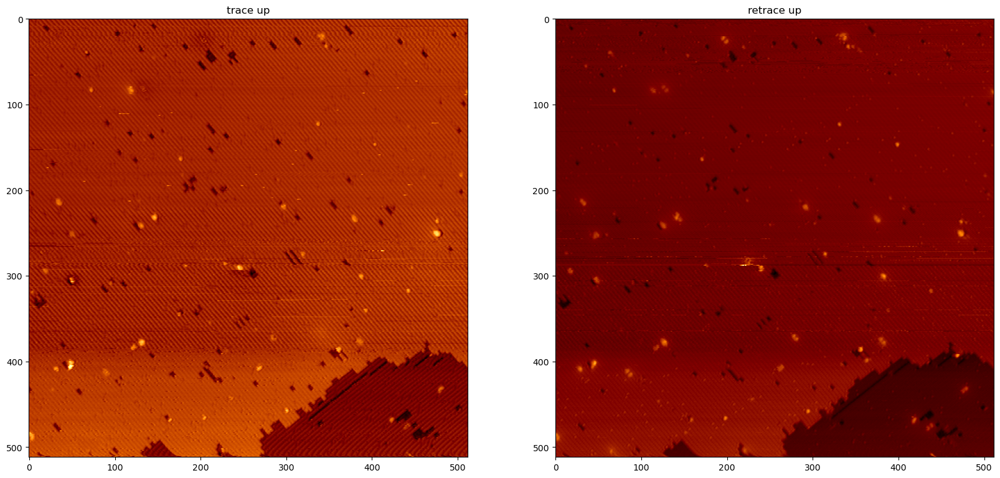

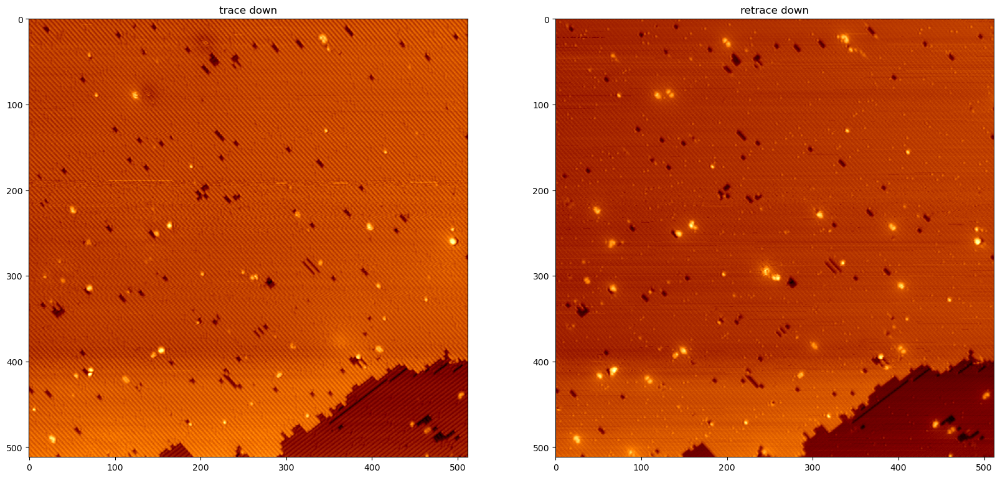

In [4]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_down_proc, cmap='afmhot')
ax[0].set_title('trace down')
ax[1].imshow(scan.retrace_down_proc, cmap='afmhot')
ax[1].set_title('retrace down')
plt.show()

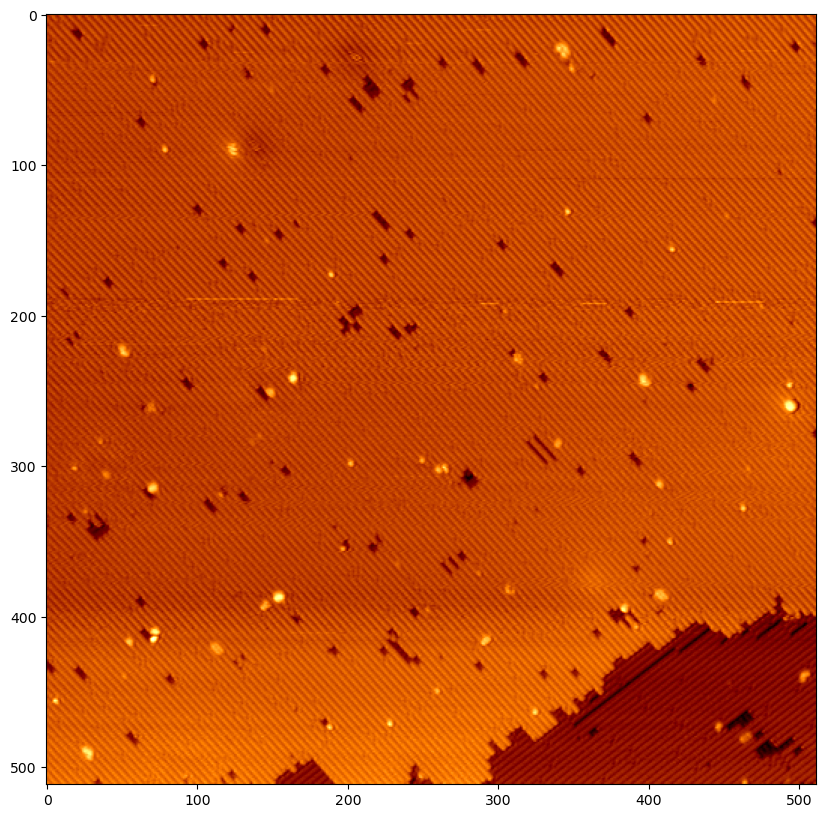

In [14]:
img = scan.trace_down_proc
plt.figure(figsize=(10,10))
plt.imshow(img, cmap='afmhot')
plt.show()

26.56505117707799
45.0
63.43494882292201
45.0
12.994616791916506
12.994616791916506
45.0
angle between coord1 and coord2: 206.56505117707798
angle between coord3 and coord1: 45.0
angle between coord2 and coord3: 243.43494882292202
angle between coord2 and coord4: 315.0
angle between coord1 and coord5: 167.0053832080835
angle between coord5 and coord1: 347.0053832080835
angle between coord2 and coord5: 135.0


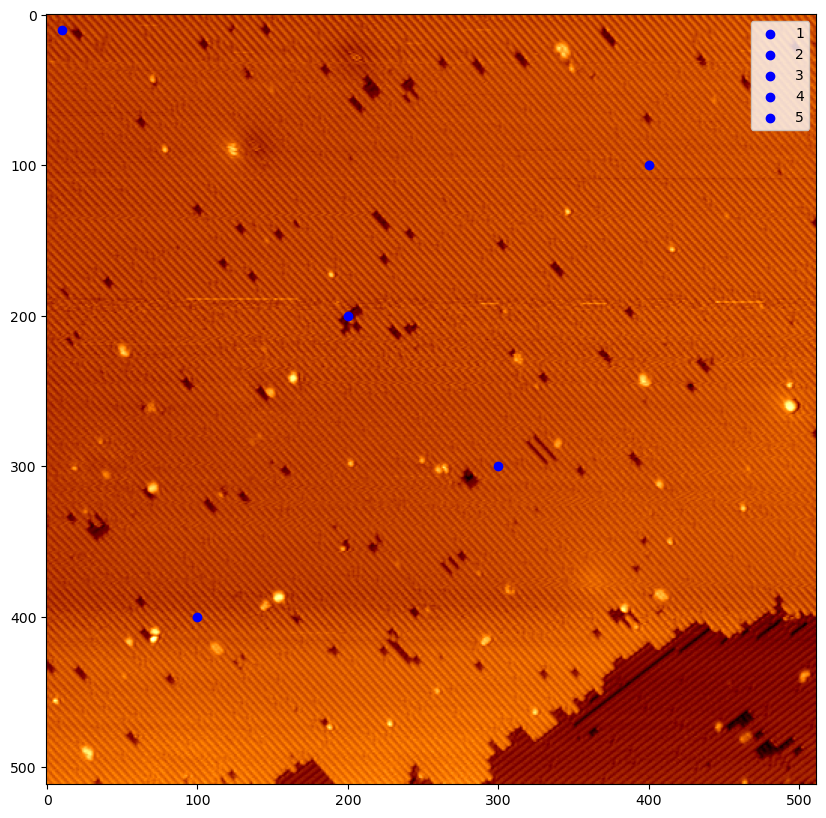

In [65]:
def sign(x):
    return 1 if x >= 0 else -1

def find_angle(self,coord1,coord2):
    '''
    Finds angle between 2 coordinates on scan (usually 2 features) and the x-axis.
    '''
    # find the coordinate which is in the top right corner

    x1, y1 = coord1
    x2, y2 = coord2
    dx = x2-x1
    dy = y2-y1
    angle = abs(np.arctan(-dy/dx))
    angle = np.rad2deg(angle)
    print(angle)
    if sign(dx)>0 and sign(dy)<=0:
        angle = angle
    elif sign(dx)<=0 and sign(dy)<=0:
        angle = 180 - angle
    elif sign(dx)<=0 and sign(dy)>0:
        angle = 180 + angle
    elif sign(dx)>0 and sign(dy)>0:
        angle = 360 - angle
    return angle        


coord1 = (400,100)
coord2 = (200,200)
coord3 = (100,400)
coord4 = (300,300)
coord5 = (10,10)

angle1 = find_angle(scan,coord1,coord2)
angle2 = find_angle(scan,coord3,coord1)
angle3 = find_angle(scan,coord2,coord3)
angle4 = find_angle(scan,coord2,coord4)
angle5 = find_angle(scan,coord1,coord5)
angle6 = find_angle(scan,coord5,coord1)
angle7 = find_angle(scan,coord2,coord5)

print('angle between coord1 and coord2:', angle1)
print('angle between coord3 and coord1:', angle2)
print('angle between coord2 and coord3:', angle3)
print('angle between coord2 and coord4:', angle4)  
print('angle between coord1 and coord5:', angle5)
print('angle between coord5 and coord1:', angle6)
print('angle between coord2 and coord5:', angle7)


# plot the coordinates on the image with the coords labelled with their number
plt.figure(figsize=(10,10))
plt.imshow(img, cmap='afmhot')
plt.scatter(*coord1, color='b', label='1')
plt.scatter(*coord2, color='b', label='2')
plt.scatter(*coord3, color='b', label='3')
plt.scatter(*coord4, color='b', label='4')
plt.scatter(*coord5, color='b', label='5')
plt.legend()
plt.show()

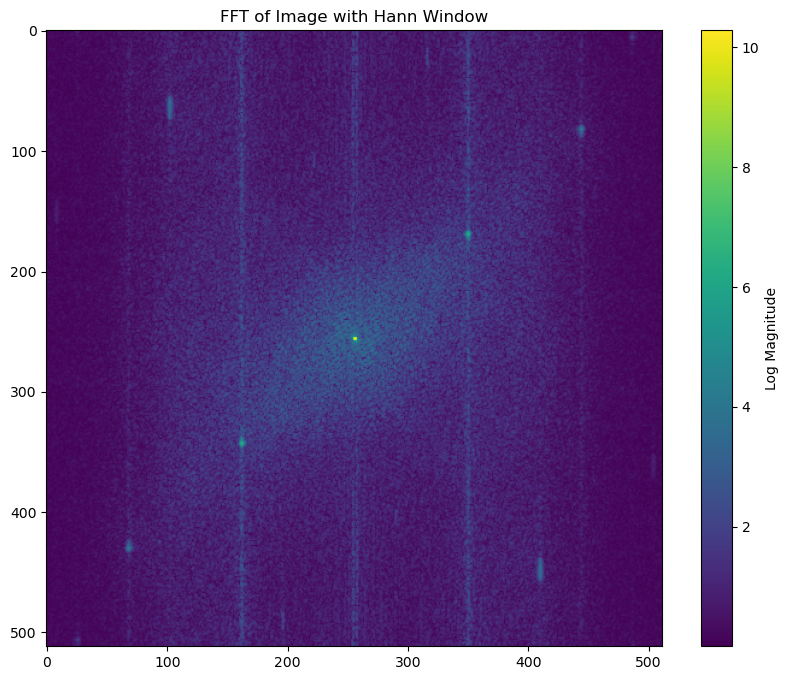

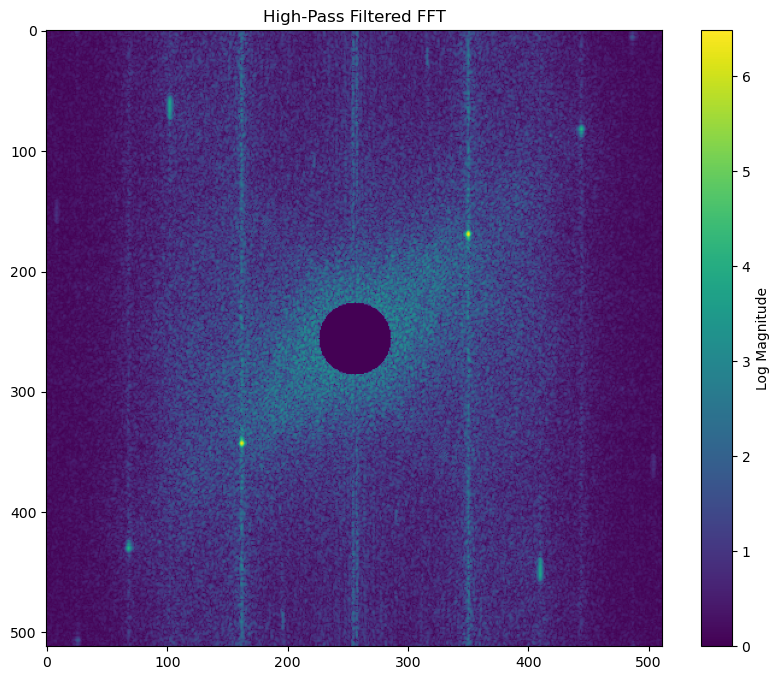

Maximum value in filtered FFT: 652.040589389182
Maximum location: (169, 350) (relative to center: -87, 94)
dx: 94, dy: -87
Angle of maximum value: 42.78524487268077


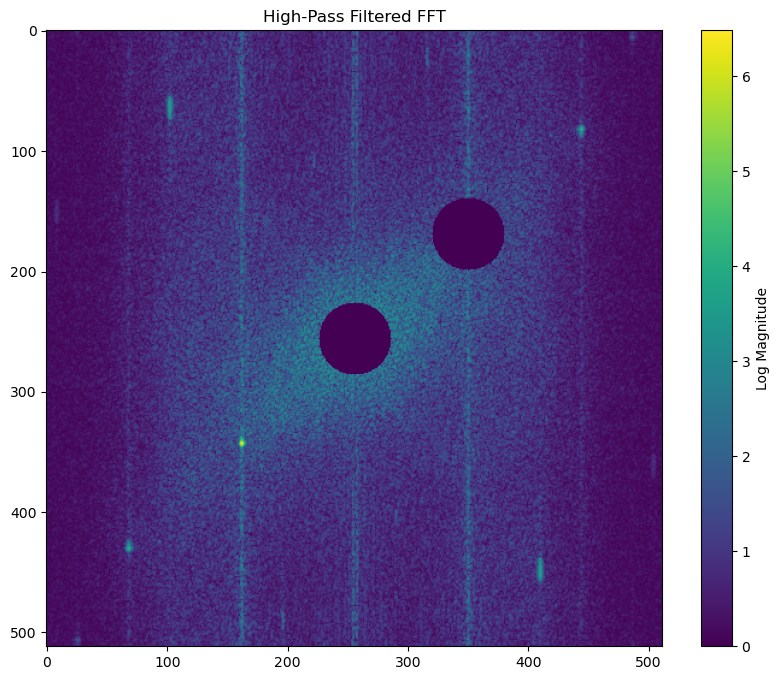

Maximum value in filtered FFT: 652.0405893891818
Maximum location: (343, 162) (relative to center: 87, -94)
dx: -94, dy: 87
Angle of maximum value: 42.78524487268077


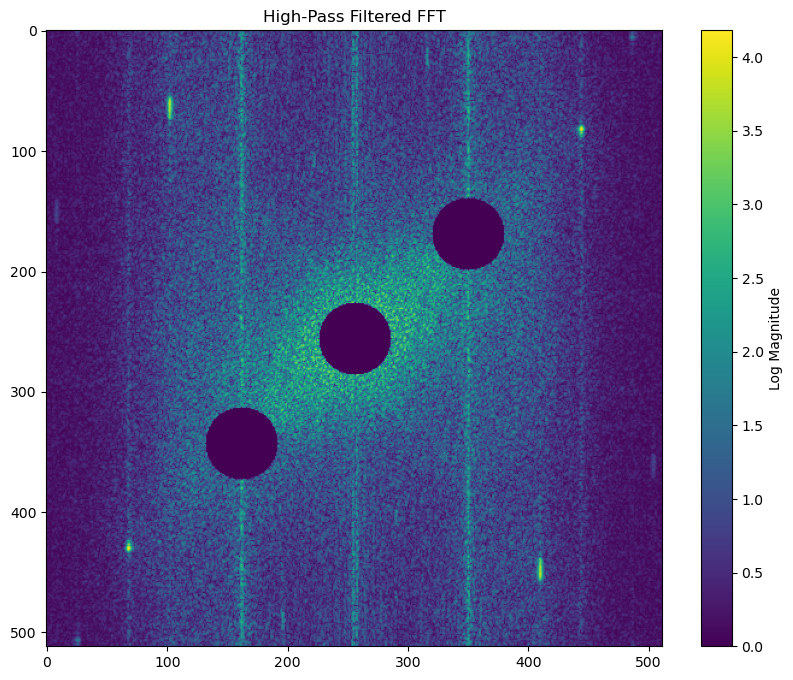

Maximum value in filtered FFT: 64.4940283282564
Maximum location: (82, 444) (relative to center: -174, 188)
dx: 188, dy: -174
Angle of maximum value: 42.78524487268077


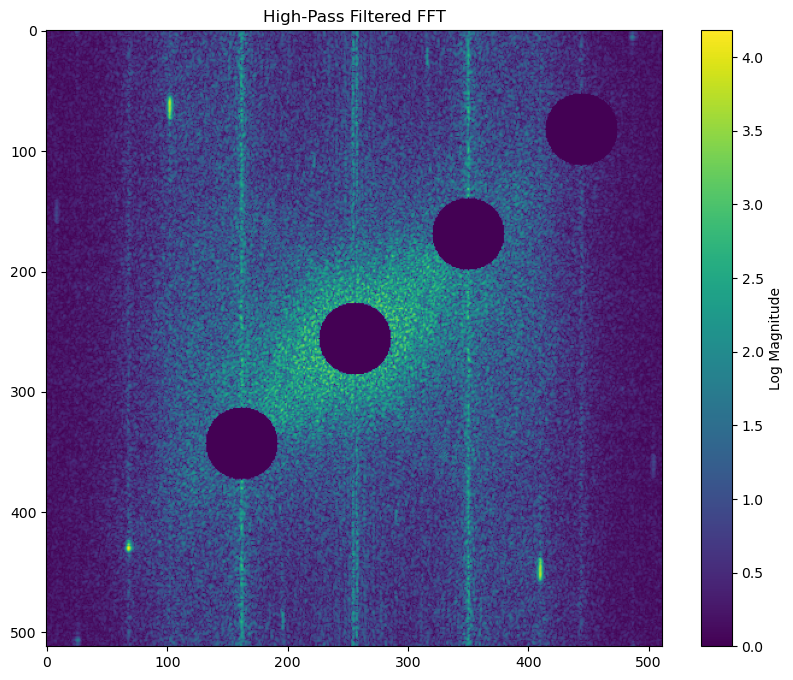

Maximum value in filtered FFT: 64.4940283282564
Maximum location: (430, 68) (relative to center: 174, -188)
dx: -188, dy: 174
Angle of maximum value: 42.78524487268077


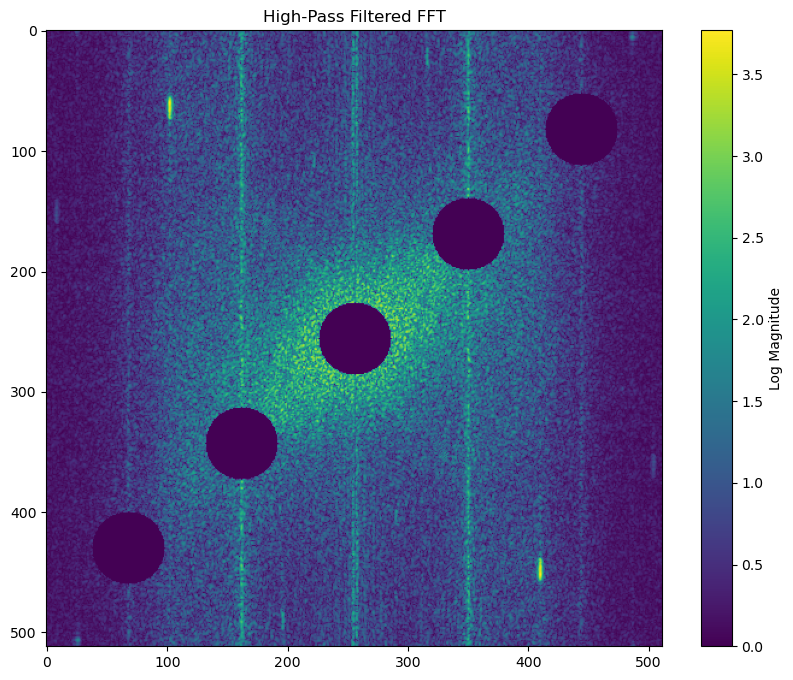

Maximum value in filtered FFT: 42.35746116104856
Maximum location: (60, 102) (relative to center: -196, -154)
dx: -154, dy: -196
Angle of maximum value: 128.15722658736905


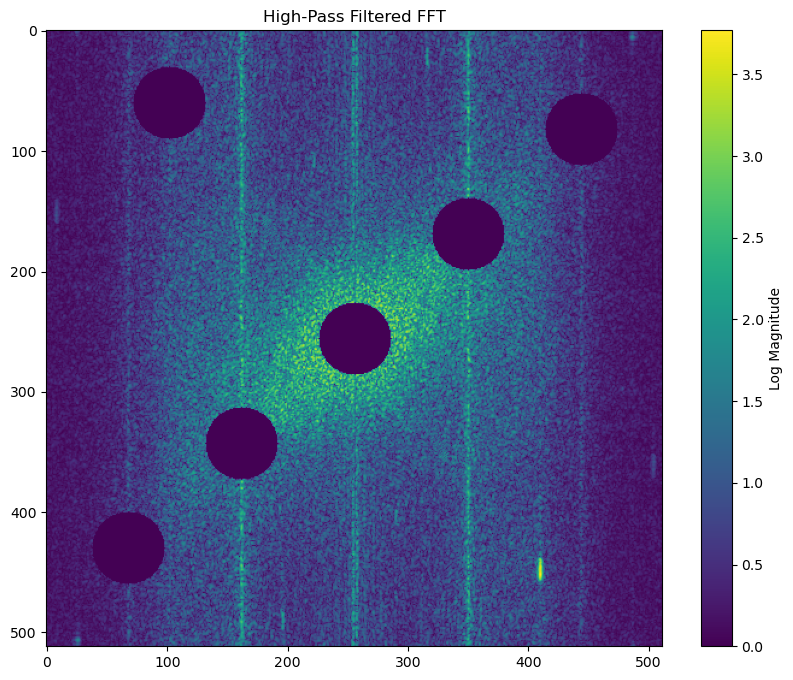

Maximum value in filtered FFT: 42.35746116104856
Maximum location: (452, 410) (relative to center: 196, 154)
dx: 154, dy: 196
Angle of maximum value: 128.15722658736905
[42.78524487268077, 42.78524487268077, 42.78524487268077, 42.78524487268077, 128.15722658736905, 128.15722658736905]


In [58]:
# Apply Hann window to the image
window = np.outer(np.hanning(img.shape[0]), np.hanning(img.shape[1]))
img_windowed = img * window

# Compute the FFT
img_fft = np.fft.fftshift(np.fft.fft2(img_windowed))
img_fft_magnitude = np.log(np.abs(img_fft) + 1)  # Log scale for better visualization

# Plot the FFT
plt.figure(figsize=(10, 8))
plt.imshow(img_fft_magnitude, cmap='viridis')
plt.colorbar(label='Log Magnitude')
plt.title('FFT of Image with Hann Window')
plt.show()

angles = []

# Create a high-pass filter
rows, cols = img.shape
crow, ccol = rows // 2, cols // 2
mask = np.ones((rows, cols), dtype=np.float32)
radius = 30  # Filter radius
y, x = np.ogrid[:rows, :cols]
mask_area = (y - crow) ** 2 + (x - ccol) ** 2 <= radius ** 2
mask[mask_area] = 0  # Block low frequencies

# Apply high-pass filter
img_fft_hp = img_fft * mask
img_fft_hp_magnitude = np.log(np.abs(img_fft_hp) + 1)

# Plot the filtered FFT
plt.figure(figsize=(10, 8))
plt.imshow(img_fft_hp_magnitude, cmap='viridis')
plt.colorbar(label='Log Magnitude')
plt.title('High-Pass Filtered FFT')
plt.show()

# Find the maximum in the filtered FFT
max_value = np.max(np.abs(img_fft_hp))
max_indices = np.unravel_index(np.argmax(np.abs(img_fft_hp)), img_fft_hp.shape)
print(f"Maximum value in filtered FFT: {max_value}")
print(f"Maximum location: {max_indices} (relative to center: {max_indices[0]-crow}, {max_indices[1]-ccol})")

# if the sign of dx and dy is the same, the angle is in the second or fourth quadrant
# if the sign of dx and dy is different, the angle is in the first or third quadrant

dx = max_indices[1]-ccol
dy = max_indices[0]-crow
print(f"dx: {dx}, dy: {dy}")
# no get the angle of the maximum value
angle = np.rad2deg(np.arctan(abs(dy)/abs(dx)))

if dx*dy<0:
    angle = angle
else:
    angle = 180-angle
print(f"Angle of maximum value: {angle}")

angles.append(angle)

for i in range(5):
    # now put a mask around the maximum value and get the next maximum value
    mask = np.ones((rows, cols), dtype=np.float32)
    mask[max_indices] = 0
    radius = 30  # Filter radius
    y, x = np.ogrid[:rows, :cols]
    mask_area = (y - max_indices[0]) ** 2 + (x - max_indices[1]) ** 2 <= radius ** 2
    mask[mask_area] = 0  # Block low frequencies

    # Apply high-pass filter
    img_fft_hp = img_fft_hp * mask
    img_fft_hp_magnitude = np.log(np.abs(img_fft_hp) + 1)

    # Plot the filtered FFT
    plt.figure(figsize=(10, 8))
    plt.imshow(img_fft_hp_magnitude, cmap='viridis')
    plt.colorbar(label='Log Magnitude')
    plt.title('High-Pass Filtered FFT')
    plt.show()

    # Find the maximum in the filtered FFT
    max_value = np.max(np.abs(img_fft_hp))
    max_indices = np.unravel_index(np.argmax(np.abs(img_fft_hp)), img_fft_hp.shape)
    print(f"Maximum value in filtered FFT: {max_value}")
    print(f"Maximum location: {max_indices} (relative to center: {max_indices[0]-crow}, {max_indices[1]-ccol})")

    # get the angle of the maximum value    
    dx = max_indices[1]-ccol
    dy = max_indices[0]-crow
    print(f"dx: {dx}, dy: {dy}")
    # no get the angle of the maximum value
    angle = np.rad2deg(np.arctan(abs(dy)/abs(dx)))

    if dx*dy<0:
        angle = angle
    else:
        angle = 180-angle
    print(f"Angle of maximum value: {angle}")
    angles.append(angle)

print(angles)


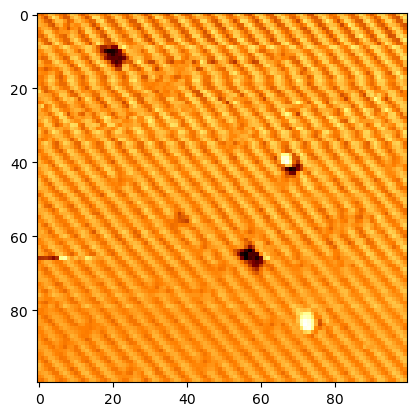

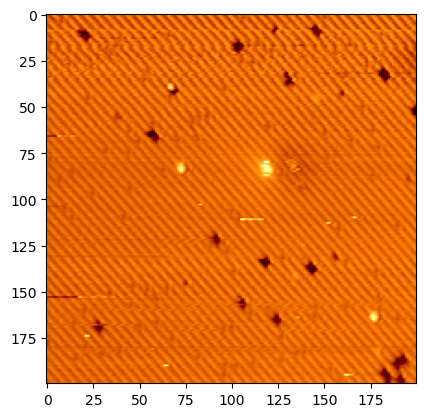

In [5]:
plt.imshow(scan.trace_up_proc[:100,:100], cmap='afmhot')
plt.show()

plt.imshow(scan.trace_up_proc[:200,:200], cmap='afmhot')

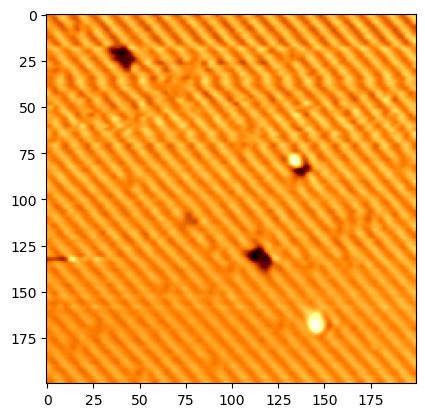

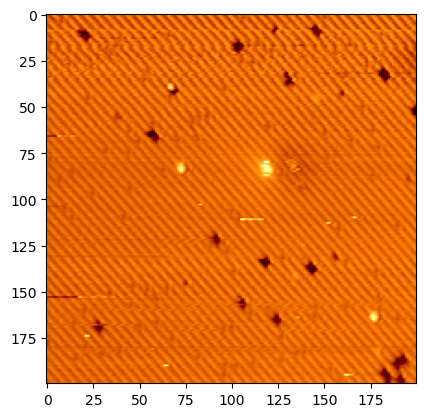

In [12]:
trace1 = torch.tensor(scan.trace_up_proc[:100,:100])
trace2 = torch.tensor(scan.trace_up_proc[:200,:200])

# change size

trace1 = transforms.Resize((200,200))(trace1.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)

plt.imshow(trace1, cmap='afmhot')
plt.show()
plt.imshow(trace2, cmap='afmhot')

In [8]:
# correct hysteresis
scan.trace_up_proc, scan.retrace_up_proc, corrected, k = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
scan.trace_down_proc, scan.retrace_down_proc, corrected, k = scan.correct_hysteresis(scan.trace_down_proc, scan.retrace_down_proc, 'trace down')
   

Number of matches found for hysteresis correction: 202 . If it's only a few (less than ~3) the correction will not be very accurate.
Number of matches found for hysteresis correction: 209 . If it's only a few (less than ~3) the correction will not be very accurate.


In [155]:
importlib.reload(asd)

c:\Users\nkolev\OneDrive - University College London\Documents\GitHub\NavigatingTheMatrix\As_detection.py:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_

<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [156]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As=False) # As = False if not dosed yet
trace_down = asd.Si_Scan(scan, 'trace down', As=False)

Resolution of image is 1024 by 1024
Resolution of image is 1024 by 1024


In [157]:
# make detector object to find and label defects
detector = asd.Detector()

In [158]:
# run prediction
trace_down.one_hot_segmented = detector.predict(trace_down)

Number of features is 478


In [159]:
# turn output into rgb image
trace_down.rgb = detector.turn_rgb(trace_down.one_hot_segmented)

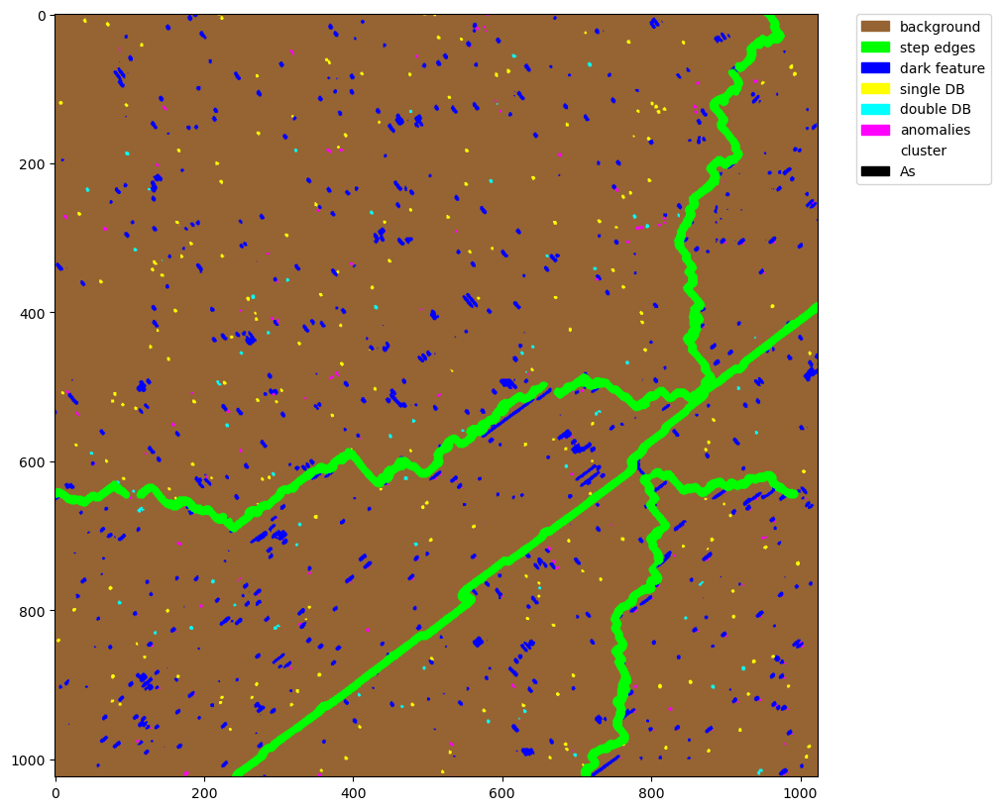

In [160]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_down.rgb)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [163]:
# find distance between all features then use this to filter for whatever features you want
trace_down.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type
#for key in trace_down.features.keys():
    #print('key:', key)
  #  print('coord: {}, feature type: {}'.format(trace_down.features[key].coord, trace_down.features[key].feature_type))




In [172]:
import gc

In [174]:
gc.collect() # clear memory

0

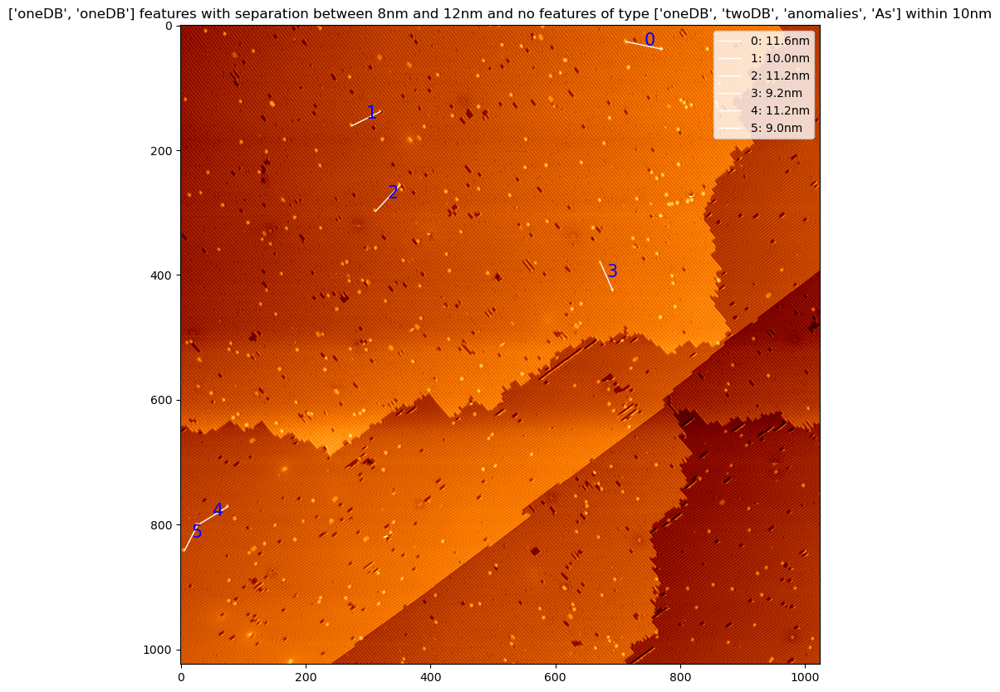

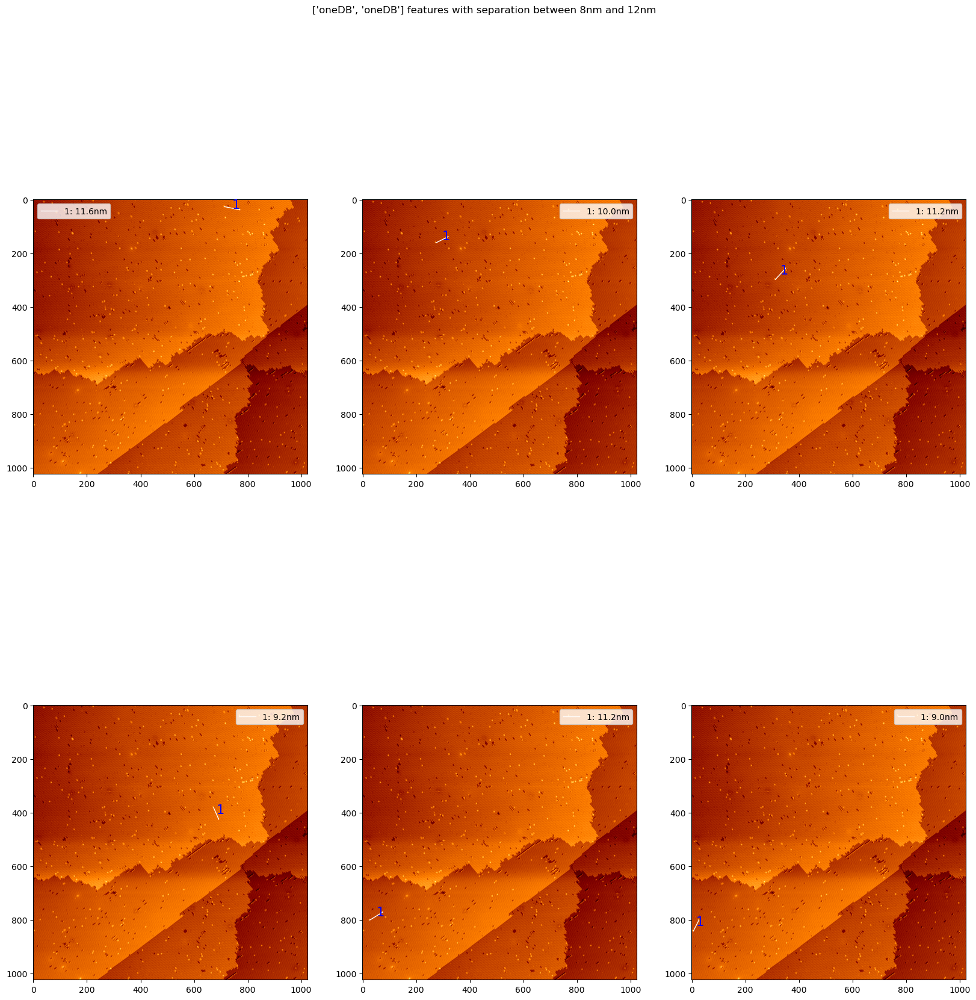

In [170]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
oneDB_to_oneDB = trace_down.find_pairs('oneDB', 'oneDB', max_dist = 12, min_dist = 8, exclusion_dist=10, display_image=True)

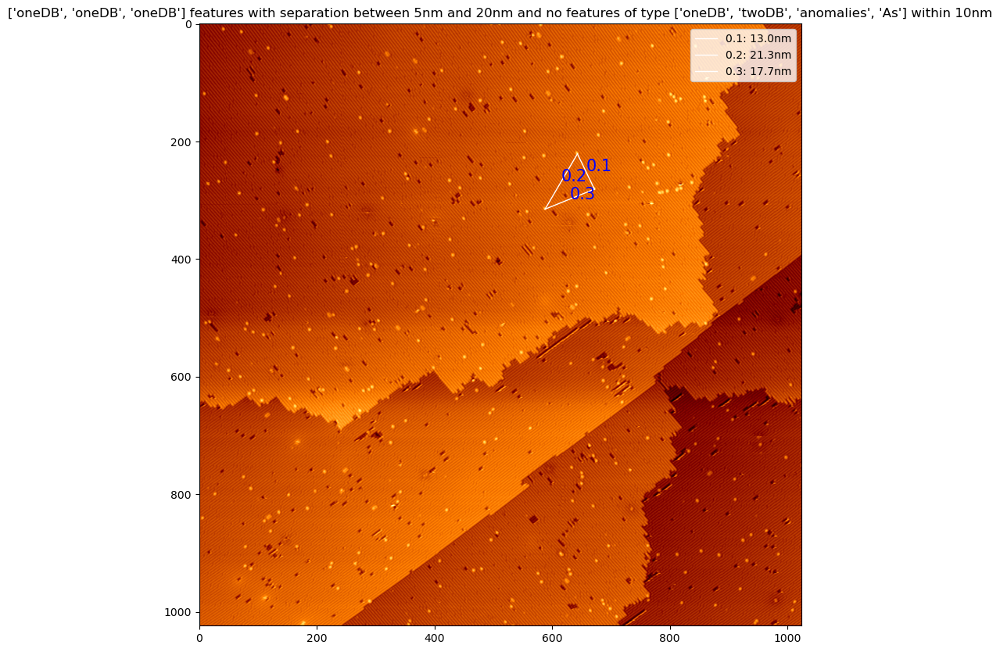

In [167]:
DB_to_DB_to_DB = trace_down.find_triplets('oneDB', 'oneDB', 'oneDB', max_dist = 20, min_dist = 5, max_angle=95, min_angle=85, exclusion_dist=10, display_image=True)

In [522]:
# load desired matrix file and make an STM object from NavigatingTheMatrix file
cwd = Path.cwd() # current working directory

path = cwd / 'Earls court examples' / '20181123-122007_STM_AtomManipulation-Earls Court-Si(100)-H term--20_1.Z_mtrx'

scan = nvm.STM( str(path) , None, None, None, standard_pix_ratio=1024/250)
    

Pixel to nm ratio is 1024pixels for every 200nm in the  trace up fwd
Pixel to nm ratio is 1024pixels for every 200nm in the  retrace up
Pixel to nm ratio is 91pixels for every 200nm in the  trace down
trace down scan was interupted before completion. It will not be used.
Pixel to nm ratio is 91pixels for every 200nm in the  retrace down
retrace down scan was interupted before completion. It will not be used.


In [523]:
# clean up the scans

scan.clean_up(scan.trace_up, 'trace up', plane_level=True)
scan.clean_up(scan.retrace_up, 'retrace up', plane_level=True)

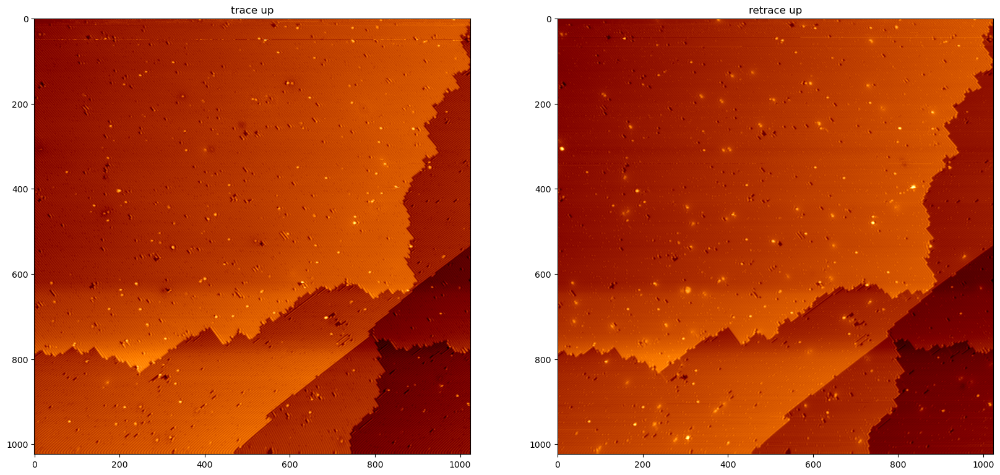

In [524]:
# plot the cleaned up scans and choose whether to use trace up or down
# (Viewing with gwyddion provides better quality images for inspection in my opinion)

fig, ax = plt.subplots(1,2, figsize=(20,15))
ax[0].imshow(scan.trace_up_proc, cmap='afmhot')
ax[0].set_title('trace up')
ax[1].imshow(scan.retrace_up_proc, cmap='afmhot')
ax[1].set_title('retrace up')
plt.show()


In [525]:
# correct hysteresis
scan.trace_up_proc, scan.retrace_up_proc, corrected = scan.correct_hysteresis(scan.trace_up_proc, scan.retrace_up_proc, 'trace up')   
   

Number of matches found for hysteresis correction: 73 . If it's only a few (less than ~3) the correction will not be very accurate.


In [499]:
importlib.reload(asd)

<module 'As_detection' from 'c:\\Users\\nkolev\\OneDrive - University College London\\Documents\\GitHub\\NavigatingTheMatrix\\As_detection.py'>

In [526]:
# make a Si_scan object just for trace down
trace_up = asd.Si_Scan(scan, 'trace up', As = True) # As = False if not dosed yet

Resolution of image is 1024


In [527]:
# make detector object to find and label defects
detector = asd.Detector()

In [528]:
# run prediction
trace_up.one_hot_segmented = detector.predict(trace_up, As = True)


Number of features is 564


In [529]:
# turn output into rgb image
trace_up.rgb = detector.turn_rgb(trace_up.one_hot_segmented)

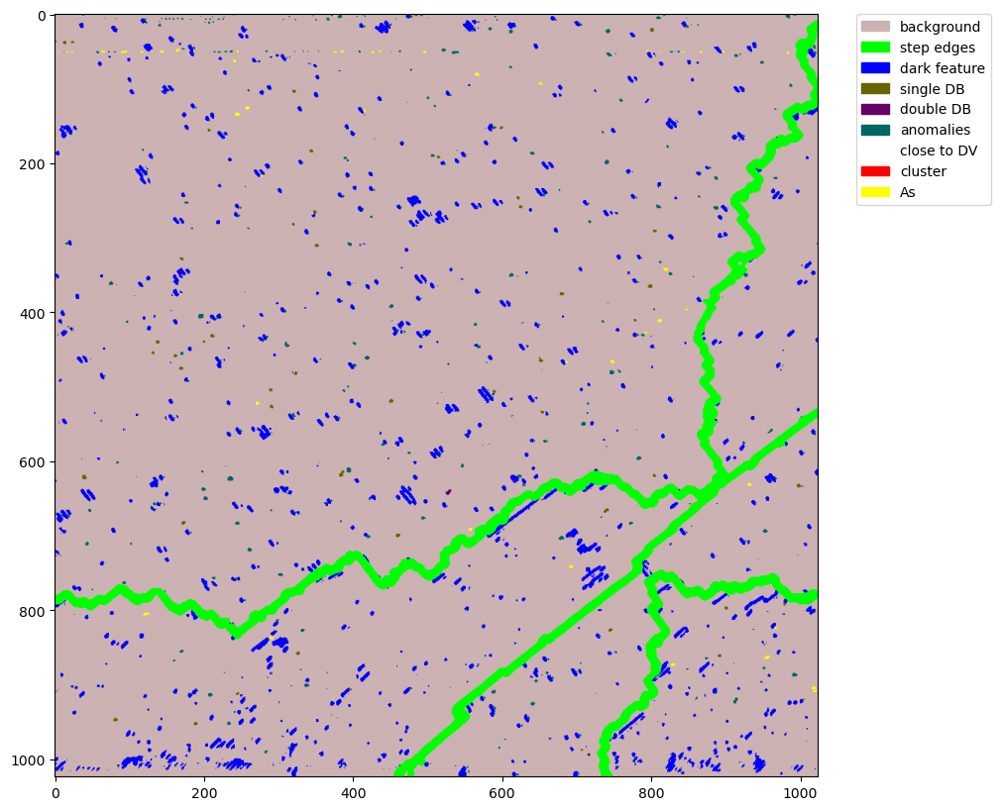

In [530]:
# show image
plt.figure(figsize=(10,10))
plt.imshow(trace_up.rgb)

# Create custom legend handles
legend_handles = []
for rgb, label in detector.legend.items():
    color = np.array(rgb)  # Normalize RGB values to [0, 1] for Matplotlib
    patch = mpatches.Patch(color=color, label=label)
    legend_handles.append(patch)

# Add the custom legend to the plot
plt.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


plt.show()

In [465]:
# find distance between all features then use this to filter for whatever features you want
trace_up.feature_dists()
# all distances are now save in a dictionary which can be accessed by trace_down.features
# keys are the different features in the scan (NOT the feature type). The features are numbered in the order they were found (so keys are 0, 1, 2, 3, etc.)
# values are feature objects (see As_detection.py for more info). Each feature object has things like feature.coord, feature.feature_type


#for key in trace_down.features.keys():
    #print('key:', key)
#    print('coord: {}, feature type: {}'.format(trace_down.features[key].coord, trace_down.features[key].feature_type))



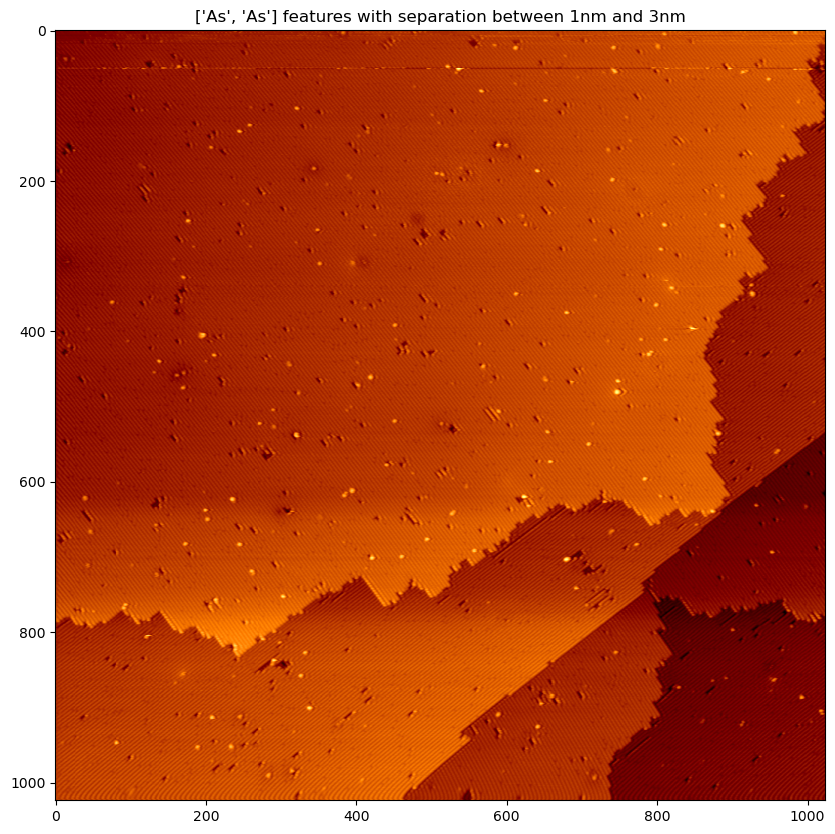

In [532]:
# find all As dopnats that are at a distance of 15nm-20nm from each other
As_to_As = trace_up.find_pairs('As', 'As', max_dist = 3, min_dist = 1, exclusion_dist=3, display_image=True)

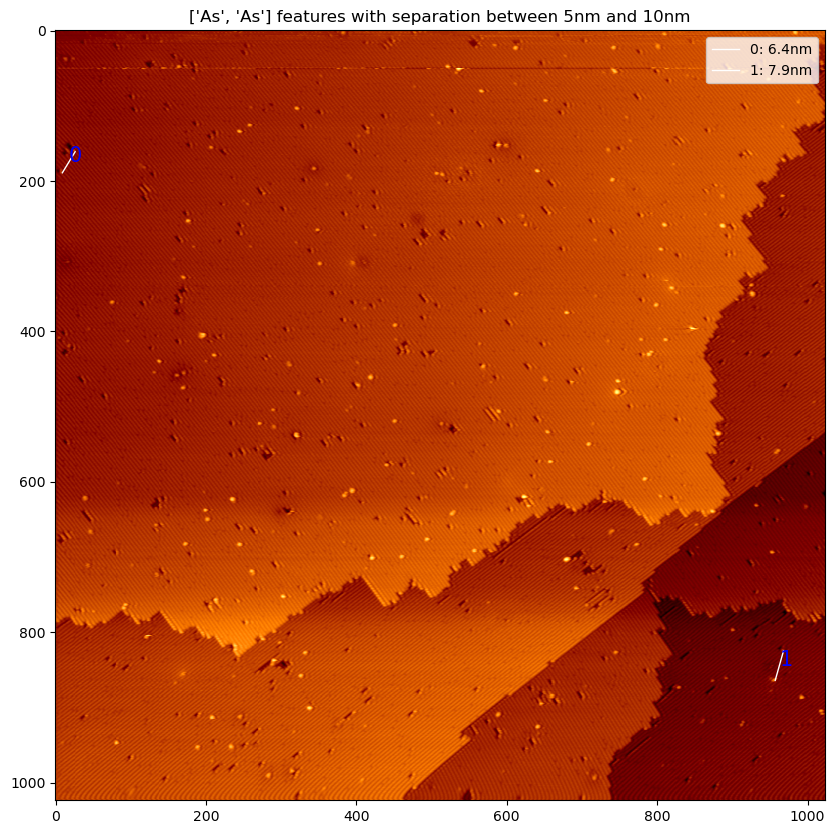

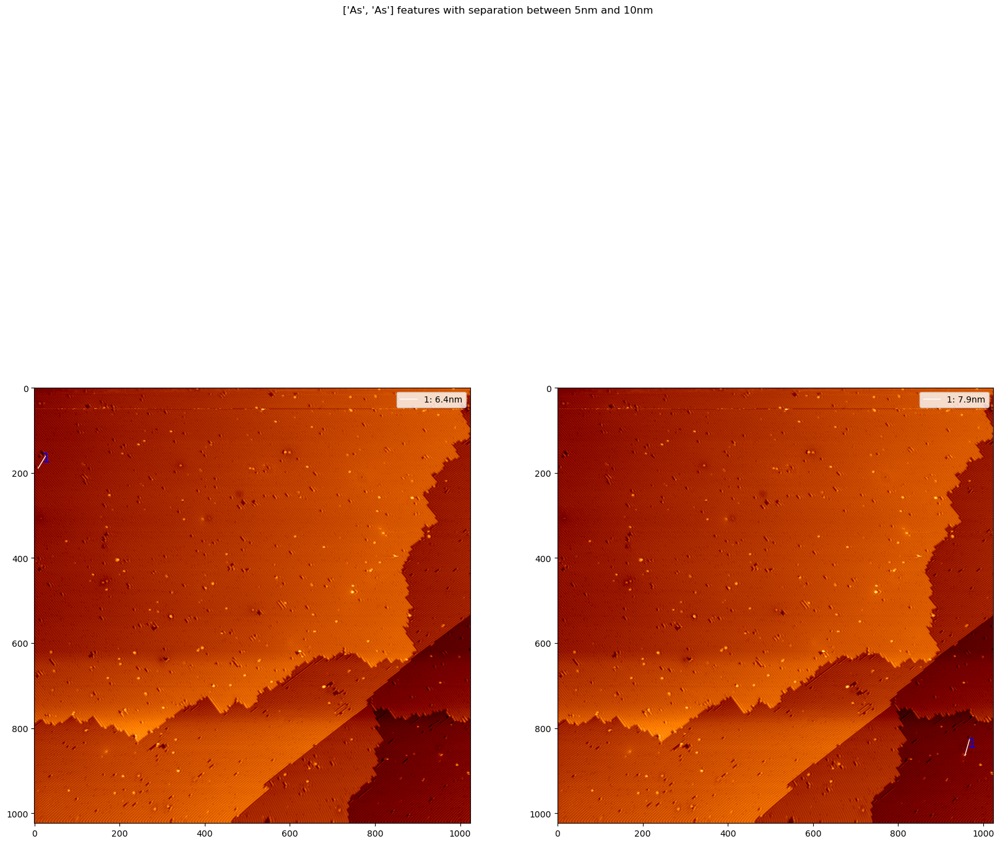

In [428]:
# find all single DBs that are at a distance of 15nm-20nm from each other
As_to_As = trace_up.find_pairs('As', 'As', max_dist = 10, min_dist = 5, exclusion_dist=10, display_image=True)


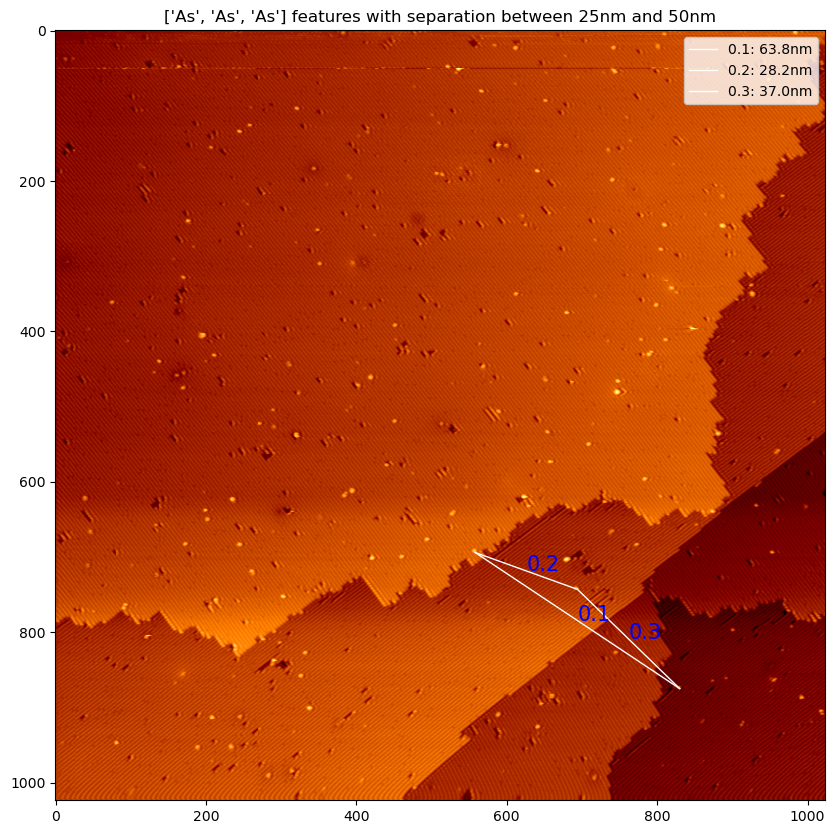

In [439]:
As_to_As_to_As = trace_up.find_triplets('As', 'As', 'As', max_dist = 50, min_dist = 25, max_angle=160, min_angle=60, exclusion_dist=35, display_image=True)

In [5]:
import dask.array as da
import numpy as np

In [11]:
a = np.ones((512,512))

b = da.from_array(a, chunks=(250,250))

print(b[1])

dask.array<getitem, shape=(512,), dtype=float64, chunksize=(250,), chunktype=numpy.ndarray>
